# Installing Dependencies

In [ ]:
!pip install numpy
!pip install matplotlib
!pip install torch torchaudio
!pip install scipy
!pip install mir_eval
!pip install noisereduce
!pip install pedalboard
!pip install sounddevice
!pip install librosa
!pip install soundfile

print("Packages and Dependencies Installed")

Packages and Dependencies Installed


# Importing Required Libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import torch
import torchaudio

from mir_eval import separation

from torchaudio.transforms import Fade
from torchaudio.pipelines import HDEMUCS_HIGH_MUSDB_PLUS
from torchaudio.utils import download_asset

print(torch.__version__)
print(torchaudio.__version__)

# For Audio Enhancement
from pedalboard.io import AudioFile
from pedalboard import *
import noisereduce as nr
import soundfile as sf
import librosa
from IPython.display import Audio, display
from scipy.signal import fftconvolve

2.5.1+cu124
2.5.1+cu124


# Implementations of Stem Seperation

In [ ]:
bundle = HDEMUCS_HIGH_MUSDB_PLUS
model = bundle.get_model()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)
sample_rate = bundle.sample_rate
print(f"Sample rate: {sample_rate}")

/usr/local/lib/python3.11/dist-packages/torchaudio/pipelines/_source_separation_pipeline.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(path)


Sample rate: 44100


In [ ]:
def separate_sources(
    model,
    mix,
    segment=10.0,
    overlap=0.1,
    device=None,):

    if device is None:
        device = mix.device
    else:
        device = torch.device(device)

    batch, channels, length = mix.shape

    chunk_len = int(sample_rate * segment * (1 + overlap))
    start = 0
    end = chunk_len
    overlap_frames = overlap * sample_rate
    fade = Fade(fade_in_len=0, fade_out_len=int(overlap_frames), fade_shape="linear")

    final = torch.zeros(batch, len(model.sources), channels, length, device=device)

    while start < length - overlap_frames:
        chunk = mix[:, :, start:end]
        with torch.no_grad():
            out = model.forward(chunk)
        out = fade(out)
        final[:, :, :, start:end] += out
        if start == 0:
            fade.fade_in_len = int(overlap_frames)
            start += int(chunk_len - overlap_frames)
        else:
            start += chunk_len
        end += chunk_len
        if end >= length:
            fade.fade_out_len = 0
    return final

In [ ]:
def plot_spectrogram(stft, title="Spectrogram"):
    magnitude = stft.abs()
    spectrogram = 20 * torch.log10(magnitude + 1e-8).numpy()
    _, axis = plt.subplots(1, 1)
    axis.imshow(spectrogram, cmap="viridis", vmin=-60, vmax=0, origin="lower", aspect="auto")
    axis.set_title(title)
    plt.tight_layout()

In [ ]:
SAMPLE_SONG = download_asset("tutorial-assets/hdemucs_mix.wav")
waveform, sample_rate = torchaudio.load(SAMPLE_SONG)  # replace SAMPLE_SONG with desired path for different song
waveform = waveform.to(device)
mixture = waveform

# Parameters

In [ ]:
segment: int = 10
overlap = 0.1

print("Separating track")

Separating track


In [ ]:
ref = waveform.mean(0)
waveform = (waveform - ref.mean()) / ref.std()  # normalization

sources = separate_sources(
    model,
    waveform[None],
    device=device,
    segment=segment,
    overlap=overlap,
)[0]

In [ ]:
sources = sources * ref.std() + ref.mean()
sources_list = model.sources
sources = list(sources)
audios = dict(zip(sources_list, sources))

In [ ]:
N_FFT = 4096
N_HOP = 4

stft = torchaudio.transforms.Spectrogram(
    n_fft=N_FFT,
    hop_length=N_HOP,
    power=None,
)

In [ ]:
def output_results(original_source: torch.Tensor, predicted_source: torch.Tensor, source: str):
    print(
        "SDR score is:",
        separation.bss_eval_sources(original_source.detach().numpy(), predicted_source.detach().numpy())[0].mean(),
    )
    plot_spectrogram(stft(predicted_source)[0], f"Spectrogram - {source}")
    return Audio(predicted_source, rate=sample_rate)

In [ ]:
segment_start = 150
segment_end = 155

frame_start = segment_start * sample_rate
frame_end = segment_end * sample_rate

drums_original = download_asset("tutorial-assets/hdemucs_drums_segment.wav")
bass_original = download_asset("tutorial-assets/hdemucs_bass_segment.wav")
vocals_original = download_asset("tutorial-assets/hdemucs_vocals_segment.wav")
other_original = download_asset("tutorial-assets/hdemucs_other_segment.wav")

drums_spec = audios["drums"][:, frame_start:frame_end].cpu()
drums, sample_rate = torchaudio.load(drums_original)

bass_spec = audios["bass"][:, frame_start:frame_end].cpu()
bass, sample_rate = torchaudio.load(bass_original)

vocals_spec = audios["vocals"][:, frame_start:frame_end].cpu()
vocals, sample_rate = torchaudio.load(vocals_original)

other_spec = audios["other"][:, frame_start:frame_end].cpu()
other, sample_rate = torchaudio.load(other_original)

mix_spec = mixture[:, frame_start:frame_end].cpu()

## Original Input Audio

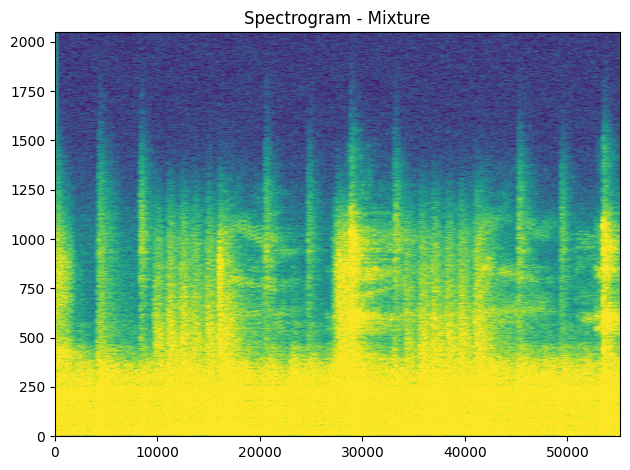

In [ ]:
plot_spectrogram(stft(mix_spec)[0], "Spectrogram - Mixture")
Audio(mix_spec, rate=sample_rate)

## Generated Output Audio

SDR score is: 5.017734227717444


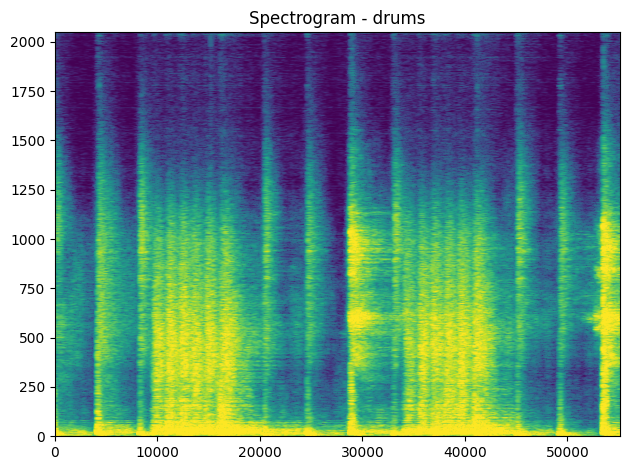

In [ ]:
output_results(drums, drums_spec, "drums")

SDR score is: 18.90925385118832


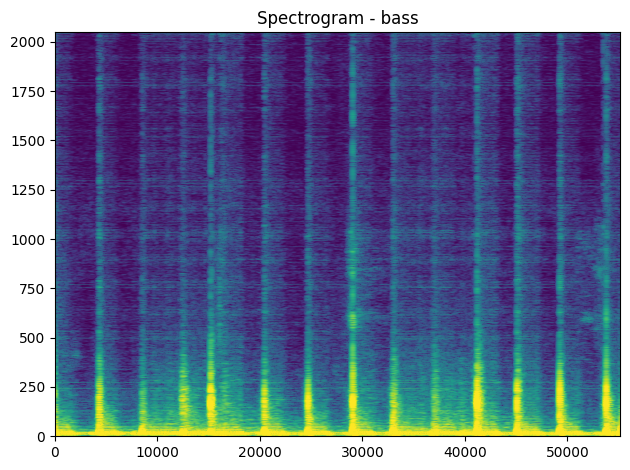

In [ ]:
output_results(bass, bass_spec, "bass")

SDR score is: 8.792413093692264


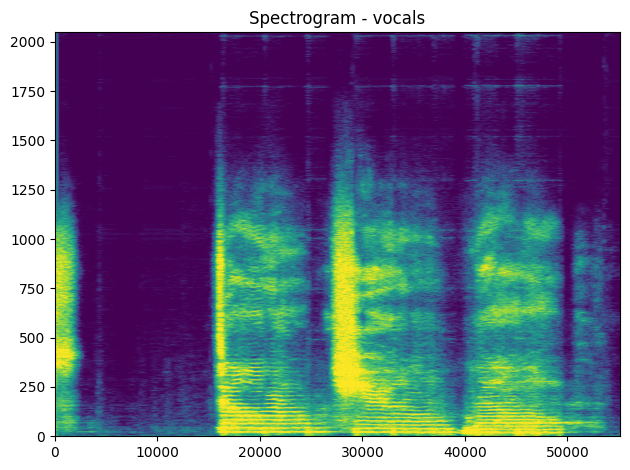

In [ ]:
output_results(vocals, vocals_spec, "vocals")

SDR score is: 8.868967479999558


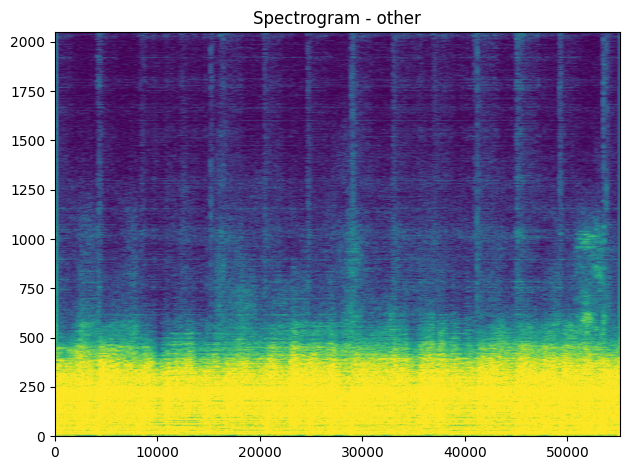

In [ ]:
output_results(other, other_spec, "other")

# Denoising Working

In [ ]:
def generate_signal(length, freq):
  t = np.linspace(0, 1, length)
  signal = np.sin(2 * np.pi * freq * t)
  return signal

In [ ]:
def add_noise(signal, noise_level):
  noise = np.random.normal(0, noise_level, len(signal))
  noisy_signal = signal + noise
  return noisy_signal

In [ ]:
def denoise_fft(noisy_signal, threshold):
  fft_signal = np.fft.fft(noisy_signal)
  fft_signal[np.abs(fft_signal) < threshold] = 0
  denoised_signal = np.real(np.fft.ifft(fft_signal))
  return denoised_signal

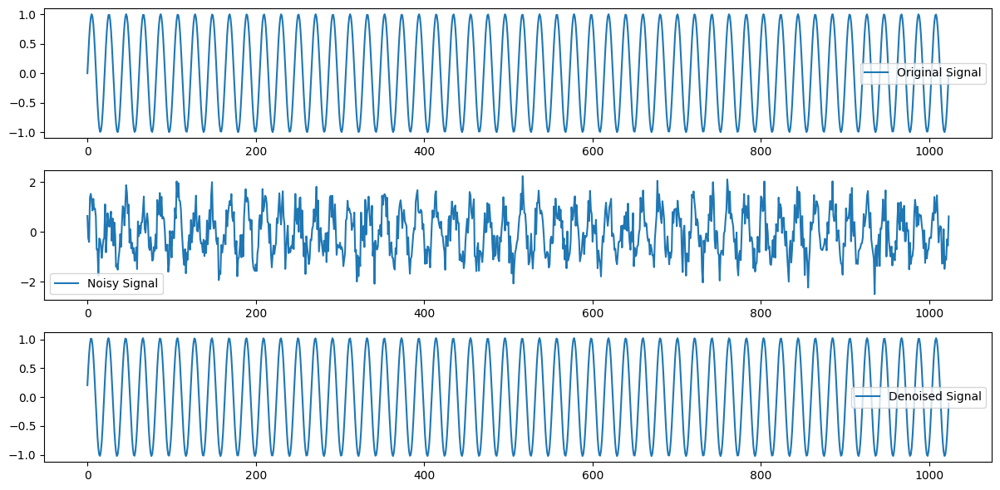

In [ ]:
if __name__ == "__main__":
  # Generate a signal
  signal_length = 1024
  signal_freq = 50
  signal = generate_signal(signal_length, signal_freq)

  # Add noise
  noise_level = 0.5
  noisy_signal = add_noise(signal, noise_level)

  # Denoise using FFT
  threshold = 100
  denoised_signal = denoise_fft(noisy_signal, threshold)

  # Plot the results
  plt.figure(figsize=(12, 6))
  plt.subplot(311)
  plt.plot(signal, label='Original Signal')
  plt.legend()
  plt.subplot(312)
  plt.plot(noisy_signal, label='Noisy Signal')
  plt.legend()
  plt.subplot(313)
  plt.plot(denoised_signal, label='Denoised Signal')
  plt.legend()
  plt.tight_layout()
  plt.show()

# Implementation of Audio Enhancement

In [ ]:
sr=44100

In [ ]:
with AudioFile('/content/morgan-freeman-convert-file.wav').resampled_to(sr) as f:
    audio = f.read(f.frames)

In [ ]:
reduced_noise = nr.reduce_noise(y=audio, sr=sr, stationary=True, prop_decrease=0.75)

board = Pedalboard([
    NoiseGate(threshold_db=-30, ratio=1.5, release_ms=250),
    Compressor(threshold_db=-16, ratio=4),
    LowShelfFilter(cutoff_frequency_hz=400, gain_db=10, q=1),
    Gain(gain_db=2)
])

effected = board(reduced_noise, sr)

In [ ]:
with AudioFile('/content/audio1_enhenced.wav', 'w', sr, effected.shape[0]) as f:
  f.write(effected)

In [ ]:
file_path = "/content/morgan-freeman-convert-file.wav"
y, sr = librosa.load(file_path)

display(Audio(y, rate=sr))

In [ ]:
file_path1 = "/content/audio1_enhenced.wav"
y1, sr1 = librosa.load(file_path)

display(Audio(y1, rate=sr1))

# New Implentation of Anti-Reverb (reverb removal)

In [ ]:
def estimate_reverb(signal, sr, ir_duration=0.5):
    """
    Estimate reverberation by simulating an impulse response.
    """
    t = np.linspace(0, ir_duration, int(sr * ir_duration), endpoint=False)
    ir = np.exp(-3 * t) * np.sin(2 * np.pi * 440 * t)

    reverb = fftconvolve(signal, ir, mode='same')
    return reverb

In [ ]:
def spectral_subtraction(signal, reverb_estimate):
    """
    Perform spectral subtraction to remove reverb.
    """
    signal_fft = np.fft.rfft(signal)
    reverb_fft = np.fft.rfft(reverb_estimate)

    enhanced_fft = np.maximum(np.abs(signal_fft) - np.abs(reverb_fft), 0) * np.exp(1j * np.angle(signal_fft))

    enhanced_signal = np.fft.irfft(enhanced_fft)
    return enhanced_signal

In [ ]:
input_audio_path = "/content/check.wav"
output_audio_path = "/content/dereverberated_audio1.wav"
audio, sr = librosa.load(input_audio_path, sr=None)

reverb_estimation = estimate_reverb(audio, sr)

dereverberated_audio = spectral_subtraction(audio, reverb_estimation)

sf.write(output_audio_path, dereverberated_audio, sr)

print(f"Dereverberated audio saved to {output_audio_path}")

Dereverberated audio saved to /content/dereverberated_audio1.wav


In [ ]:
file_path = "/content/check.wav"
y, sr = librosa.load(file_path)


display(Audio(y, rate=sr))

In [ ]:
file_path = "/content/dereverberated_audio1.wav"
y, sr = librosa.load(file_path)

display(Audio(y, rate=sr))